In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter
import datetime
from datetime import datetime, timedelta
import json
import itertools
from tqdm import tqdm
import os
os.chdir("/content/drive/MyDrive/projects/Store_Sales-Time_Series_Forecasting/")
from models.model import SVR_log

In [2]:
conf = json.load(open("config/config.json"))
conf_model = json.load(open("config/config_SVR_log.json"))
conf.update(conf_model)

all_params = []
for v in itertools.product(*conf["cv_params"].values()):
  z = dict(zip(conf["cv_params"].keys(), v))
  if conf["standardscaler"]: # 標準化を使いたい場合
    z.update({"standardscaler_features" : conf["standardscaler_features"]})
  all_params.append(z)
len(all_params)

32

In [3]:
# 特徴量
df_add_f = pd.read_csv("store-sales-time-series-forecasting/train_upgini.csv", index_col=0, parse_dates=True)
df_add_f.head()

,dcoilwtico,avg_oil,dayofweek_cos,dayofweek_sin,wd,type_Additional,type_Bridge,type_Event,type_Holiday,type_Transfer,type_Work Day,wageday,school_season,f_year_cos1_cd165f8c,f_year_cos3_8db0059c,f_finance_umap_4_d6d95b66,f_mlending_approve_score_d4c33397
date,,,,,,,,,,,,,,,,,
2017-04-21,49.640000,51.190952,-0.222521,-9.749279e-01,1,0,0,0,0,0,0,0,1,-0.474951,0.996298,5.773014,0.383328
2017-04-22,49.393333,51.021429,0.623490,-7.818315e-01,0,0,0,0,0,0,0,0,1,-0.490029,0.999407,5.815888,0.279096
2017-04-23,49.146667,50.851905,1.000000,-2.449294e-16,0,0,0,0,0,0,0,0,1,-0.504961,0.999852,5.821791,0.291966
2017-04-24,48.900000,50.682381,0.623490,7.818315e-01,1,0,0,0,0,0,0,0,1,-0.519744,0.997630,5.806848,0.403509
2017-04-25,49.220000,50.512857,-0.222521,9.749279e-01,1,0,0,0,0,0,0,0,1,-0.534373,0.992749,9.111323,0.384689


In [4]:
df_add_f.describe()

,dcoilwtico,avg_oil,dayofweek_cos,dayofweek_sin,wd,type_Additional,type_Bridge,type_Event,type_Holiday,type_Transfer,type_Work Day,wageday,school_season,f_year_cos1_cd165f8c,f_year_cos3_8db0059c,f_finance_umap_4_d6d95b66,f_mlending_approve_score_d4c33397
count,133.000000,133.000000,1.330000e+02,1.330000e+02,133.000000,133.000000,133.0,133.000000,133.000000,133.000000,133.0,133.000000,133.000000,133.000000,133.000000,133.000000,133.000000
mean,47.257857,47.333412,-2.754689e-17,-2.754689e-17,0.691729,0.007519,0.0,0.007519,0.022556,0.015038,0.0,0.067669,0.541353,-0.794032,0.082643,4.801610,0.345373
std,2.031336,1.982392,7.097802e-01,7.097802e-01,0.463525,0.086711,0.0,0.086711,0.149046,0.122162,0.0,0.252127,0.500171,0.181527,0.731317,0.739678,0.061181
min,42.480000,43.277143,-9.009689e-01,-9.749279e-01,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,-0.999963,-0.999667,2.508491,0.261132
25%,45.840000,45.707143,-9.009689e-01,-7.818315e-01,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,-0.959933,-0.658402,4.242400,0.291966
50%,47.493333,47.640952,-2.225209e-01,-2.449294e-16,1.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,-0.838280,0.158559,4.850233,0.335037
75%,49.030000,49.002857,6.234898e-01,7.818315e-01,1.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,1.000000,-0.658402,0.833556,5.308893,0.384236
max,51.120000,51.190952,1.000000e+00,9.749279e-01,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,-0.365723,0.999852,9.111323,0.542215


In [5]:
# trainデータ
df_train = pd.read_csv("store-sales-time-series-forecasting/train.csv", index_col=1, parse_dates=True)
df_train.head()

,id,store_nbr,family,sales,onpromotion
date,,,,,
2013-01-01,0,1,AUTOMOTIVE,0.0,0
2013-01-01,1,1,BABY CARE,0.0,0
2013-01-01,2,1,BEAUTY,0.0,0
2013-01-01,3,1,BEVERAGES,0.0,0
2013-01-01,4,1,BOOKS,0.0,0


In [6]:
df_test = pd.read_csv("store-sales-time-series-forecasting/test.csv", index_col=1, parse_dates=True)
df_test.head()

,id,store_nbr,family,onpromotion
date,,,,
2017-08-16,3000888,1,AUTOMOTIVE,0
2017-08-16,3000889,1,BABY CARE,0
2017-08-16,3000890,1,BEAUTY,2
2017-08-16,3000891,1,BEVERAGES,20
2017-08-16,3000892,1,BOOKS,0


In [7]:
def walk_forward_validation(df_X, df_y , model, cutoffs):
  indexes = []
  y_vals = []
  y_preds =[]  
  for i in range(len(cutoffs)-1):
    train_start = cutoffs[i]["start"]
    train_end = cutoffs[i]["end"]
    val_start = cutoffs[i+1]["start"]
    val_end = cutoffs[i+1]["end"]

    X_train = df_X.loc[train_start : train_end]
    y_train = df_y.loc[train_start : train_end]
    X_val = df_X.loc[val_start : val_end]
    y_val = df_y.loc[val_start : val_end] 
    y_vals.extend(y_val)

    # モデルの学習
    model.fit(X_train, y_train)
    # 検証データの予測
    y_preds.extend(model.predict(X_val))
    indexes.extend(df_y.loc[val_start : val_end].index)

  df_cv = pd.DataFrame({"y" : y_vals, "y_pred" : y_preds}, index=indexes)
  return df_cv

In [8]:
all_params[0]

{'C': 0.01,
 'gamma': 0.01,
 'kernel': 'rbf',
 'random_state': 13,
 'standardscaler_features': ['dcoilwtico', 'f_finance_umap_4_d6d95b66']}

### 学習

In [9]:
from sklearn.metrics import mean_squared_log_error

result = []
sub = []
cutoffs = conf["cv_periods"]
family2pattern = conf["family2pattern"]
pattern2drop_columns = conf["pattern2drop_columns"]

for family in tqdm(df_train["family"].unique()):
  pattern = family2pattern[family]
  drop_columns = pattern2drop_columns[pattern]
  
  for nbr in df_train["store_nbr"].unique():
    df_y = df_train.query(" (family==@family) & (store_nbr==@nbr) ").sales
    rmsles = []
    for params in all_params:
      if family in cutoffs:
        cutoff = cutoffs[family]
      else:
        cutoff = cutoffs["other"]
      
      model = SVR_log(**params, drop_features=drop_columns)
      df_cv = walk_forward_validation(df_add_f, df_y , model, cutoff)

      y_true = df_cv["y"]
      y_pred = df_cv["y_pred"]
      y_pred[y_pred<0] = 0 # 予測が0未満の場合は0に置換

      rmsles.append(mean_squared_log_error(y_true, y_pred, squared=False))
    
    best_params = pd.DataFrame({"all_params" : all_params, "rmsles" : rmsles}).sort_values("rmsles").iloc[0].to_list()
    best_params.extend([family, nbr])
    result.append(best_params)

100%|██████████| 33/33 [31:19<00:00, 56.95s/it]


In [10]:
# df_resultに評価データでの指標を記録
df_result = pd.DataFrame(result)
df_result.columns = ["params", "val_RMSLE", "family", "store_nbr"]
df_result = df_result.sort_values(["store_nbr", "family"])
df_result = df_result.reset_index(drop=True)
df_result.head()

,params,val_RMSLE,family,store_nbr
0,"{'C': 0.1, 'gamma': 10, 'kernel': 'linear', 'r...",0.624249,AUTOMOTIVE,1
1,"{'C': 0.01, 'gamma': 0.01, 'kernel': 'rbf', 'r...",0.000000,BABY CARE,1
2,"{'C': 0.01, 'gamma': 0.01, 'kernel': 'rbf', 'r...",0.456527,BEAUTY,1
3,"{'C': 0.01, 'gamma': 0.01, 'kernel': 'rbf', 'r...",0.399550,BEVERAGES,1
4,"{'C': 0.01, 'gamma': 0.01, 'kernel': 'rbf', 'r...",0.448476,BOOKS,1


In [11]:
# 全体の平均
val_rmsle = df_result["val_RMSLE"].mean()
print(val_rmsle)
df_result.groupby(["family"]).mean().sort_values("val_RMSLE", ascending=False)

0.39502117222409966


,val_RMSLE,store_nbr
family,,
LINGERIE,0.632980,27.5
GROCERY II,0.570362,27.5
HARDWARE,0.549262,27.5
CELEBRATION,0.546403,27.5
BEAUTY,0.533257,27.5
"LIQUOR,WINE,BEER",0.519636,27.5
SEAFOOD,0.519150,27.5
AUTOMOTIVE,0.515247,27.5
MAGAZINES,0.514735,27.5


### テストデータで精度見る

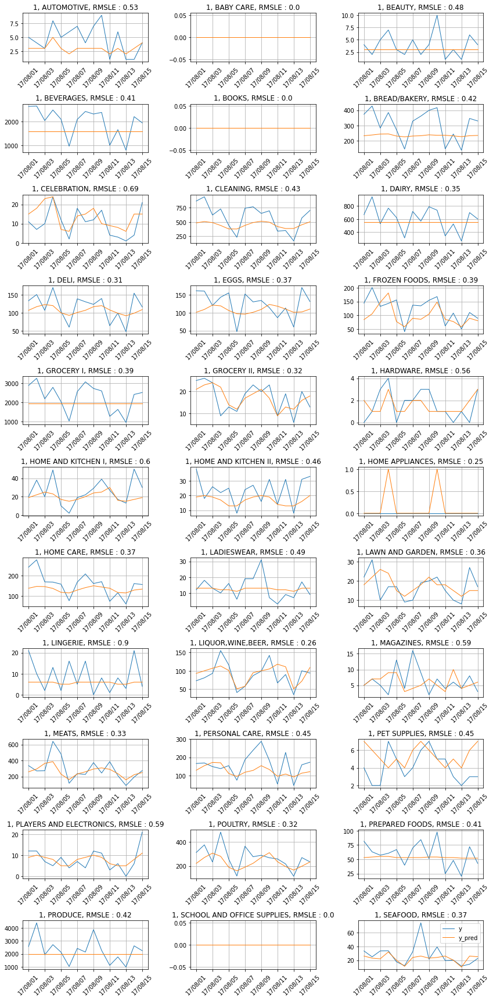

******************************


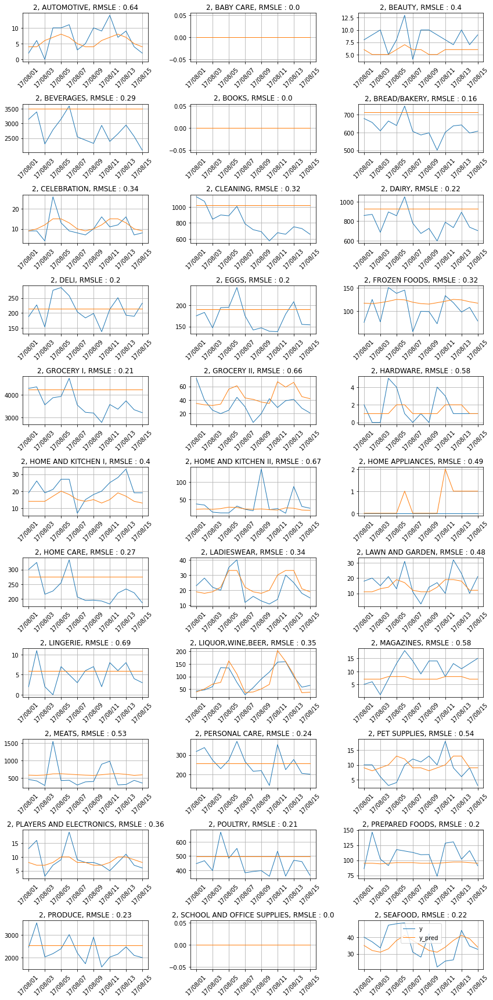

******************************


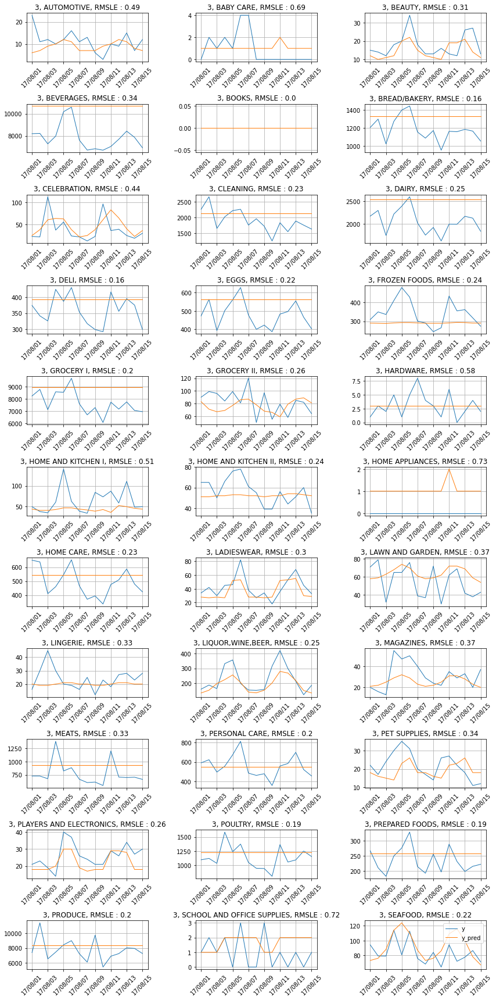

******************************


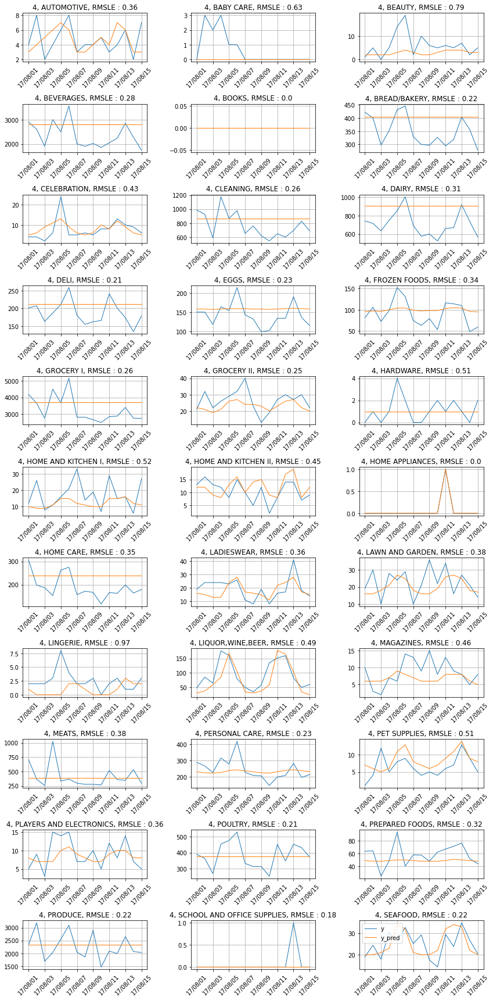

******************************


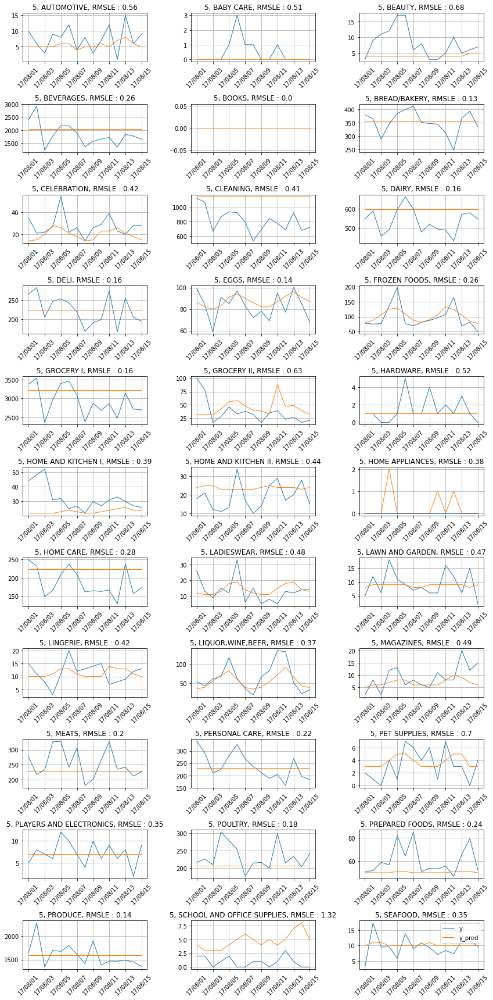

******************************


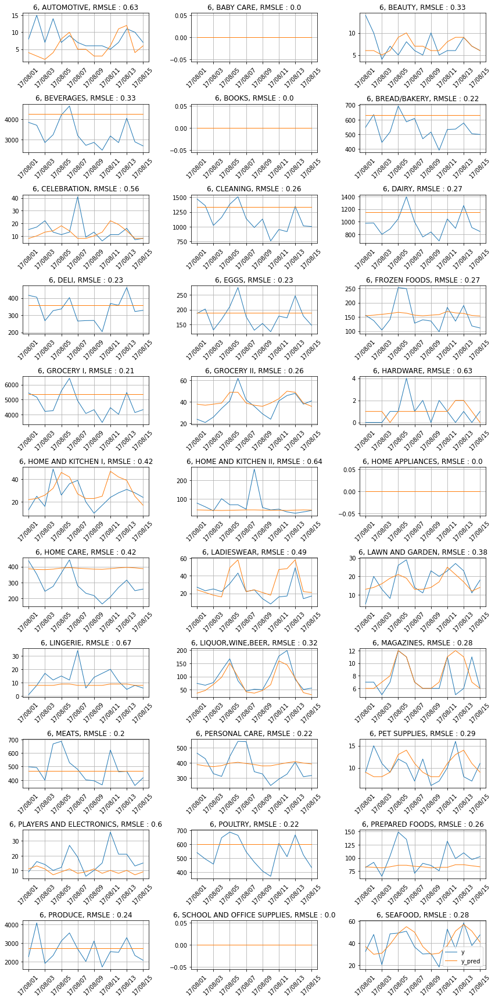

******************************


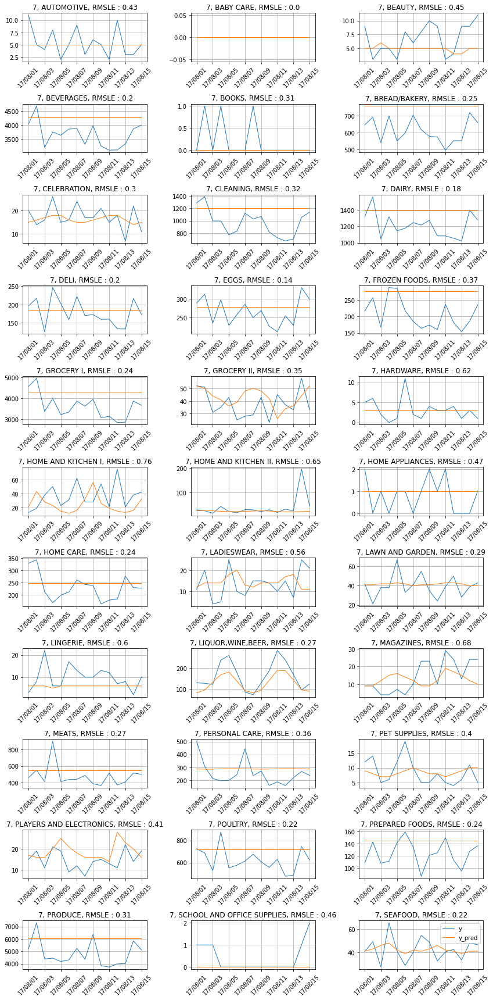

******************************


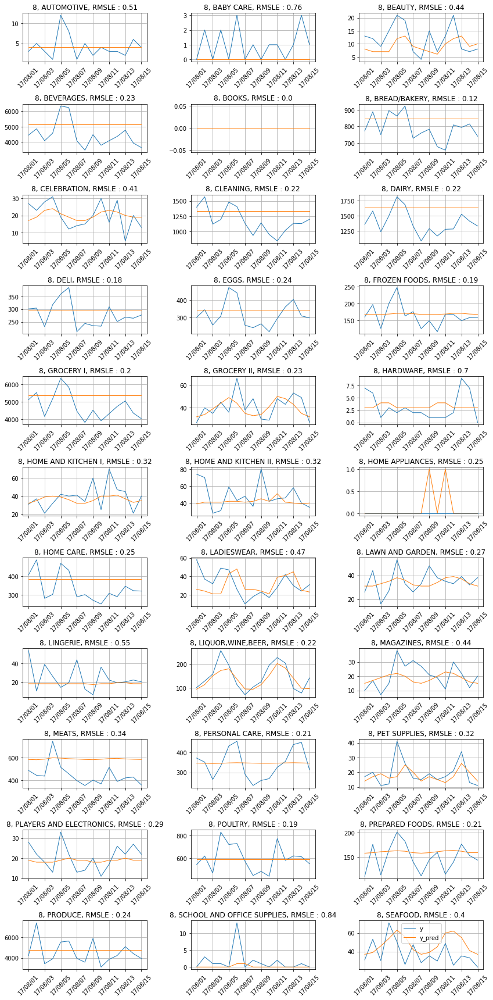

******************************


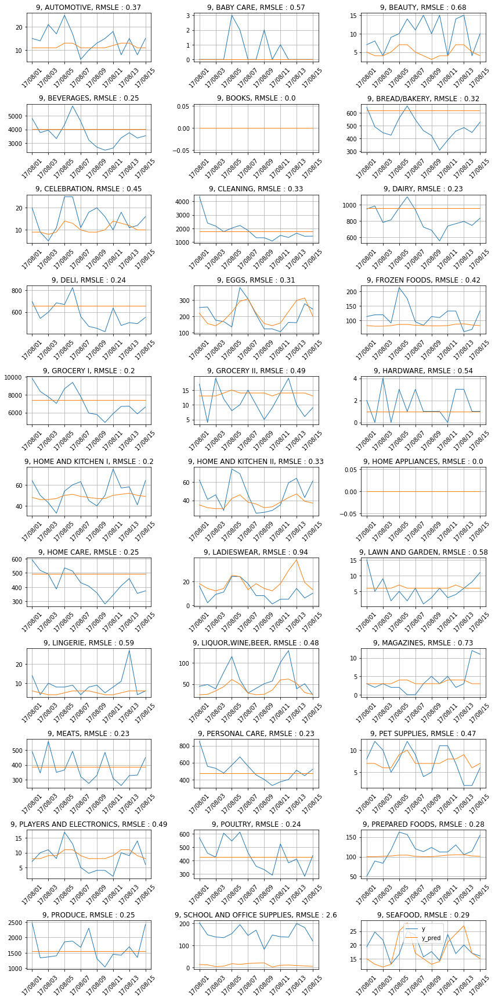

******************************


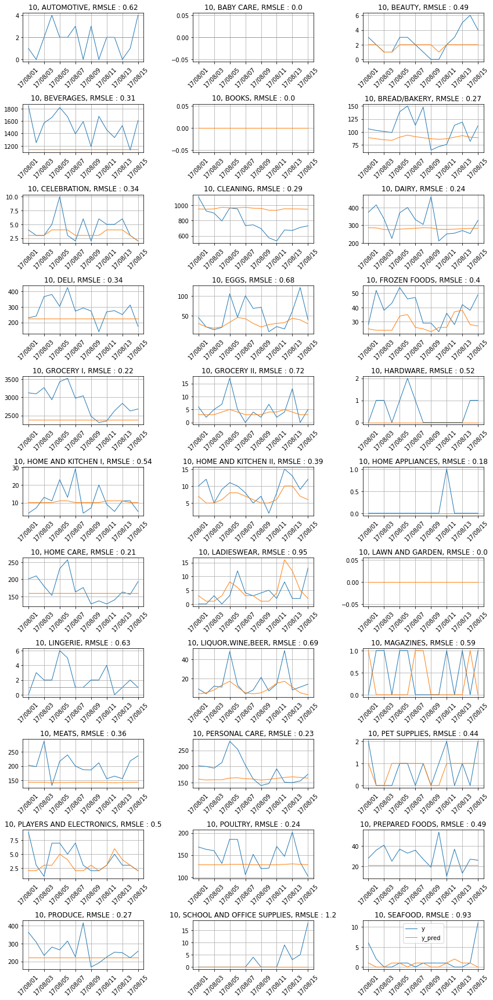

******************************


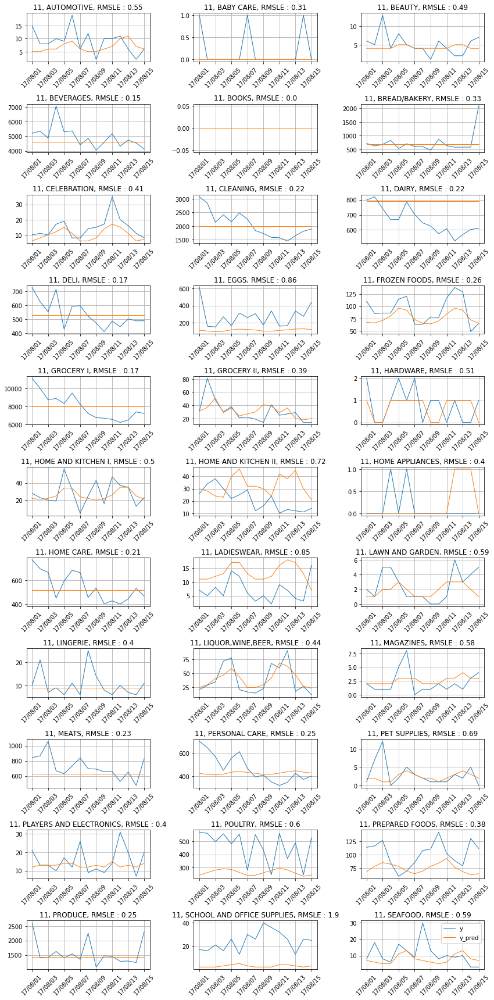

******************************


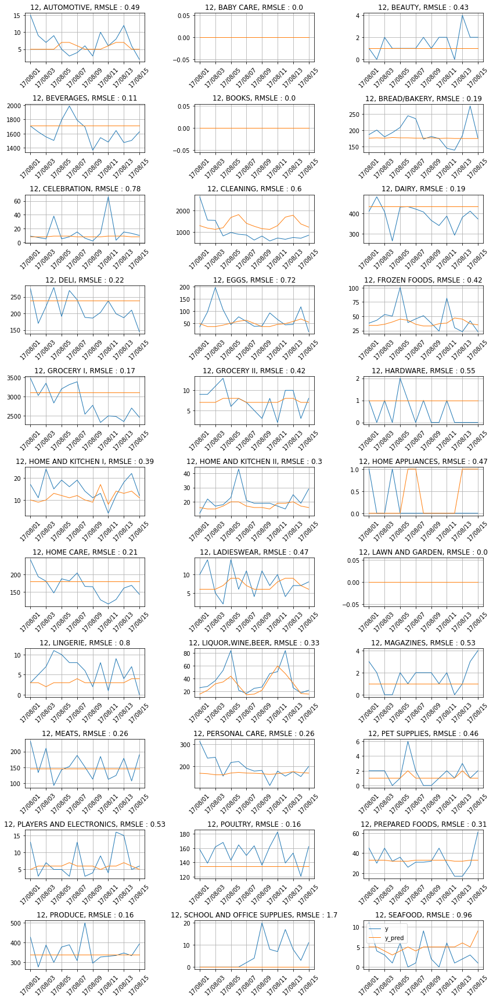

******************************


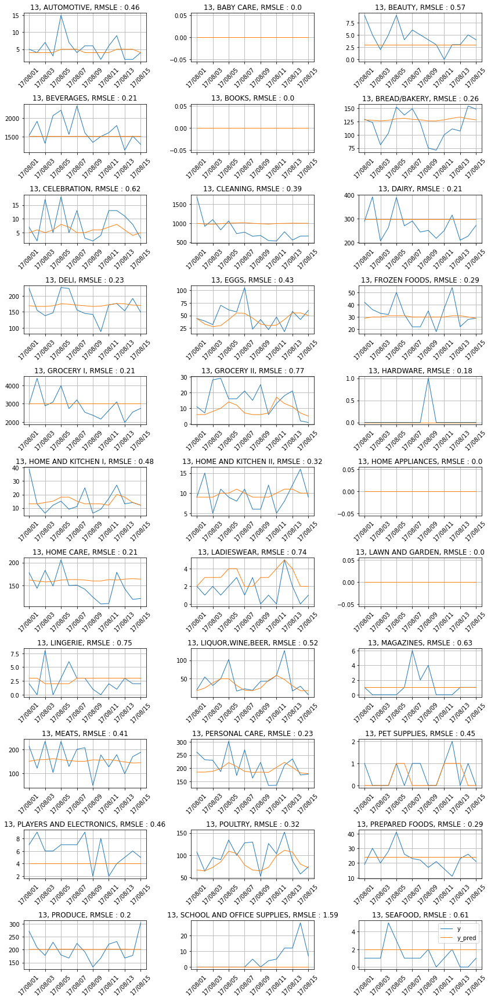

******************************


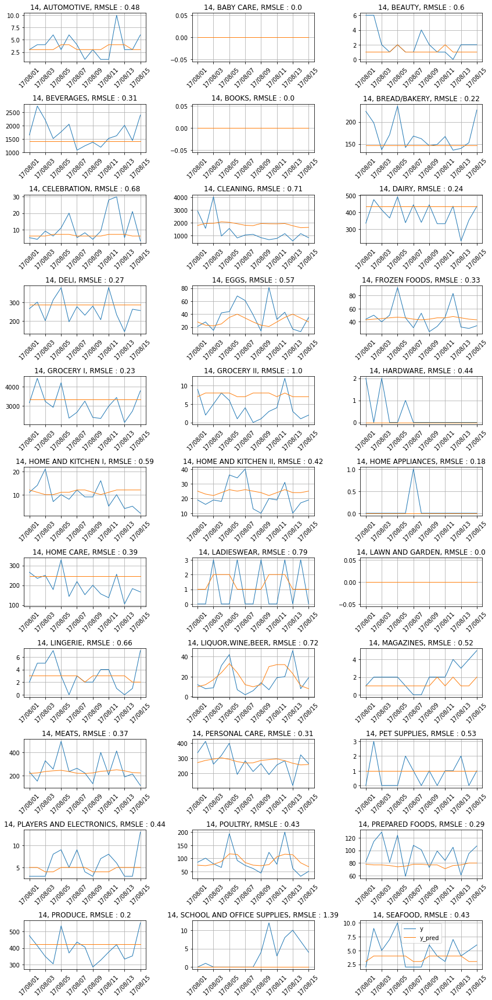

******************************


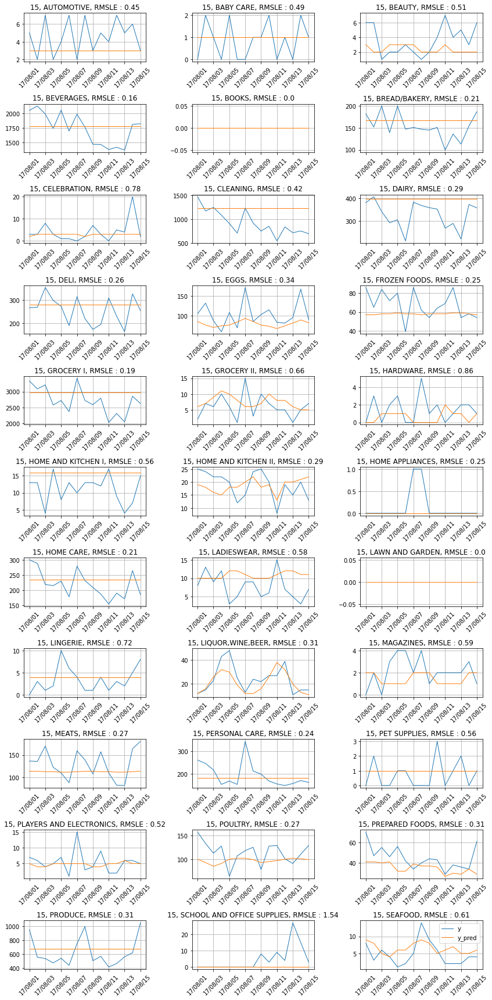

******************************


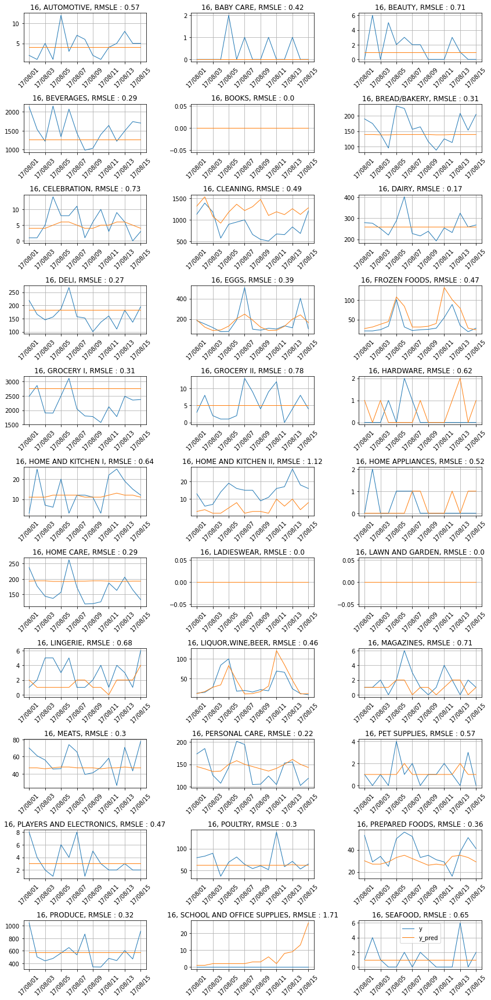

******************************


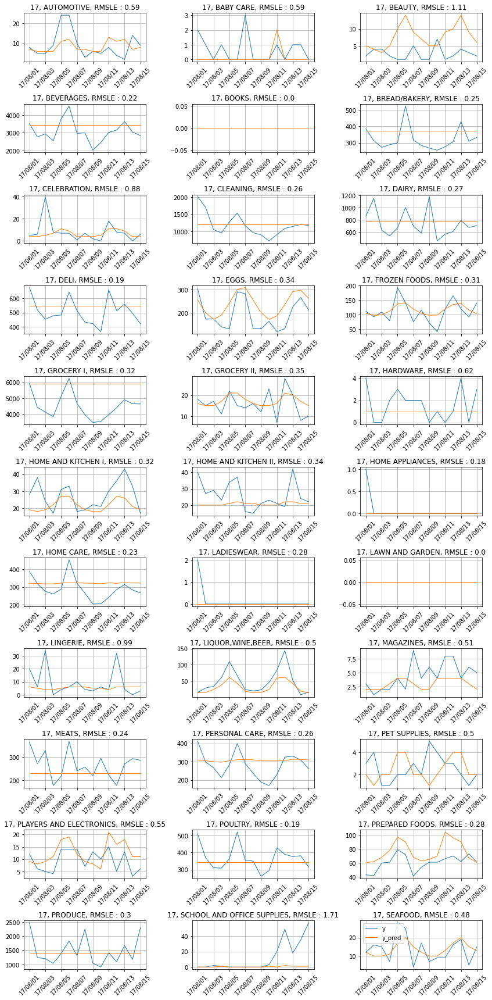

******************************


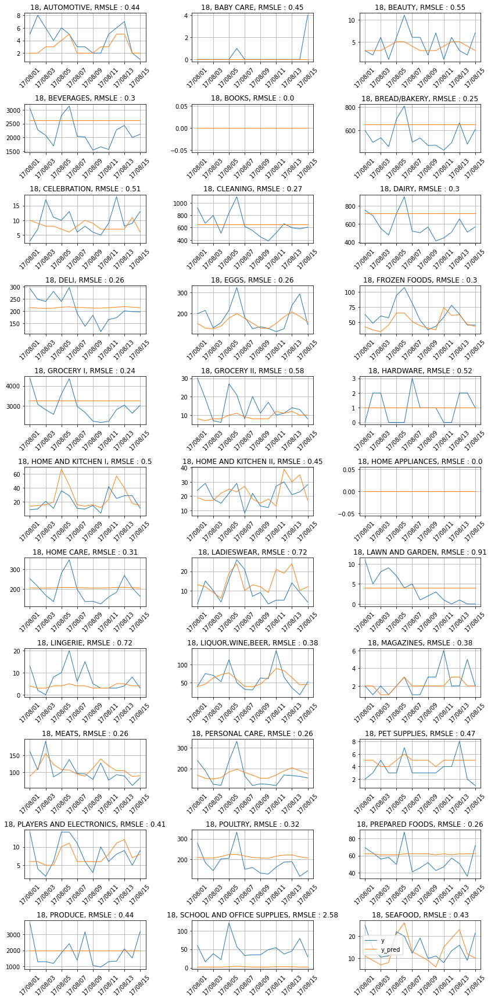

******************************


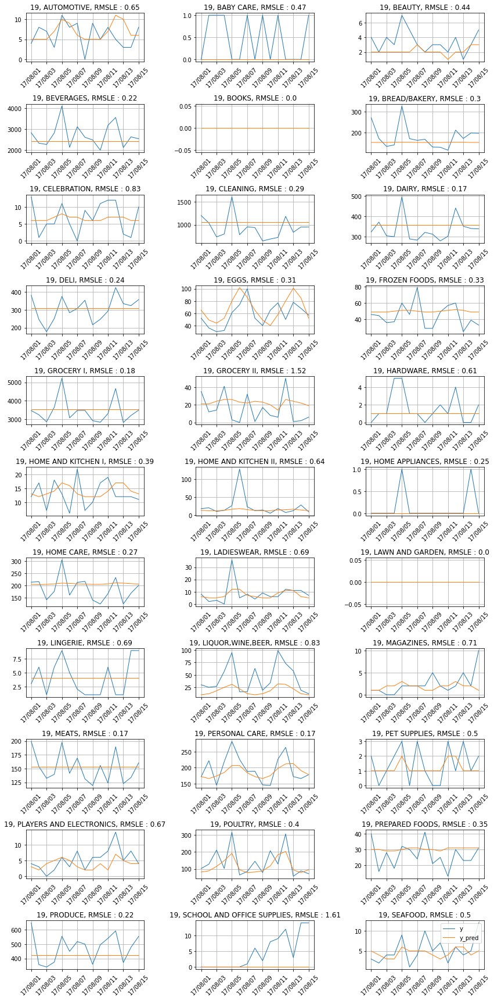

******************************


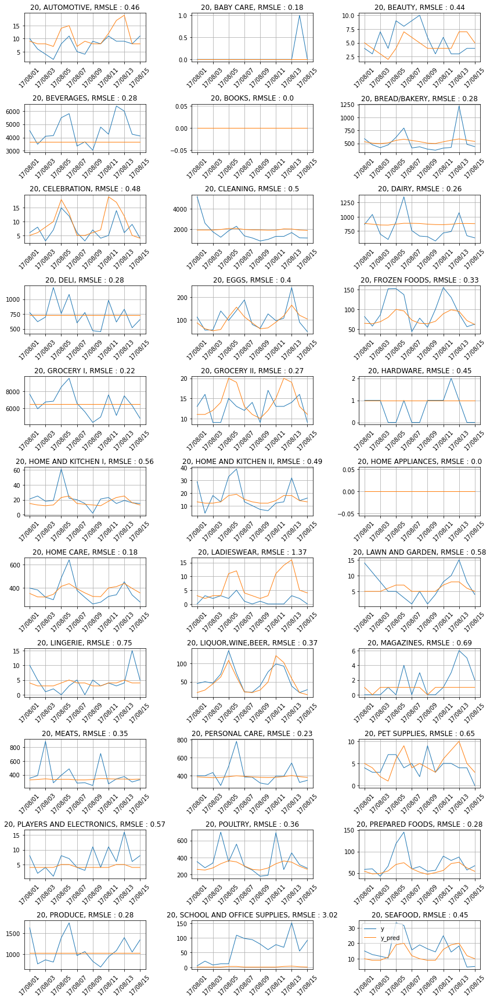

******************************


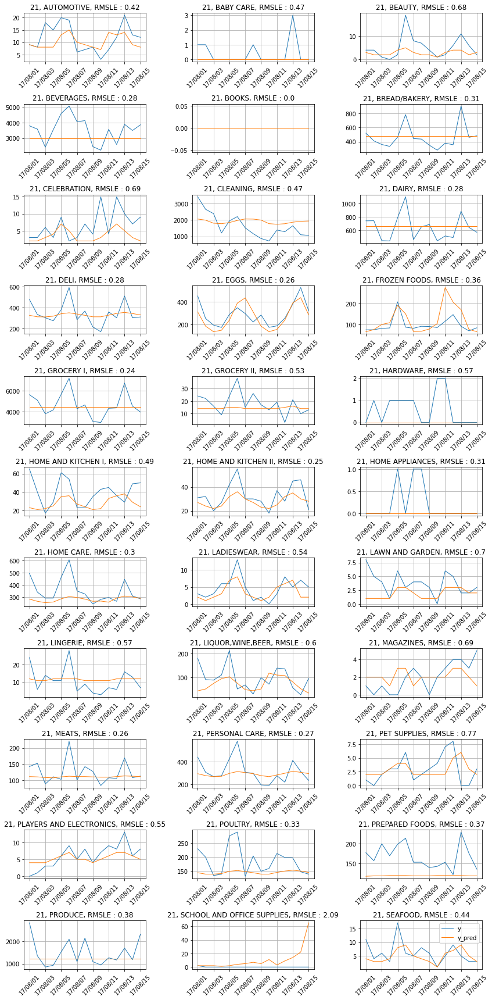

******************************


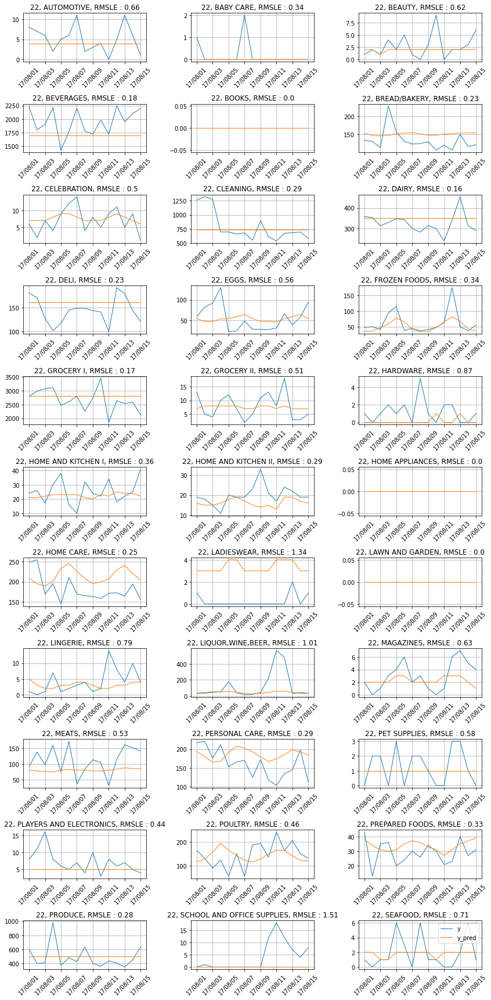

******************************


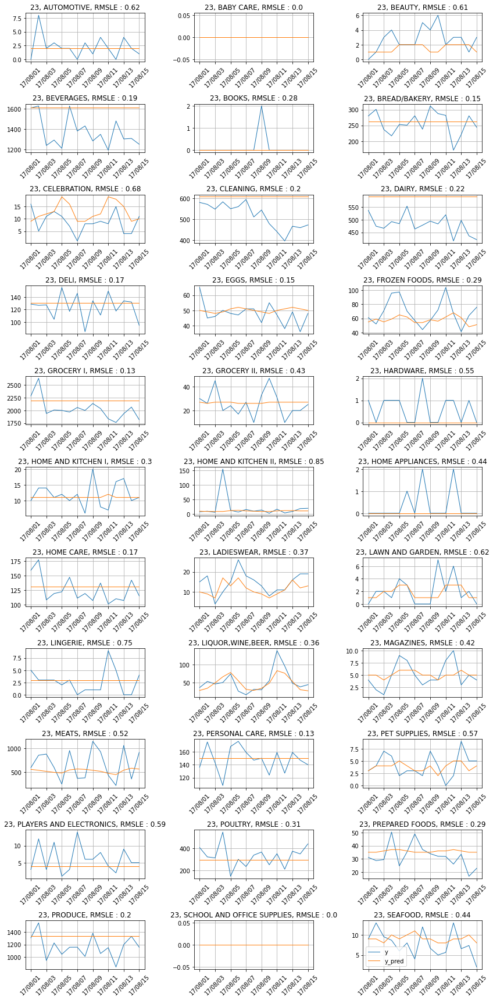

******************************


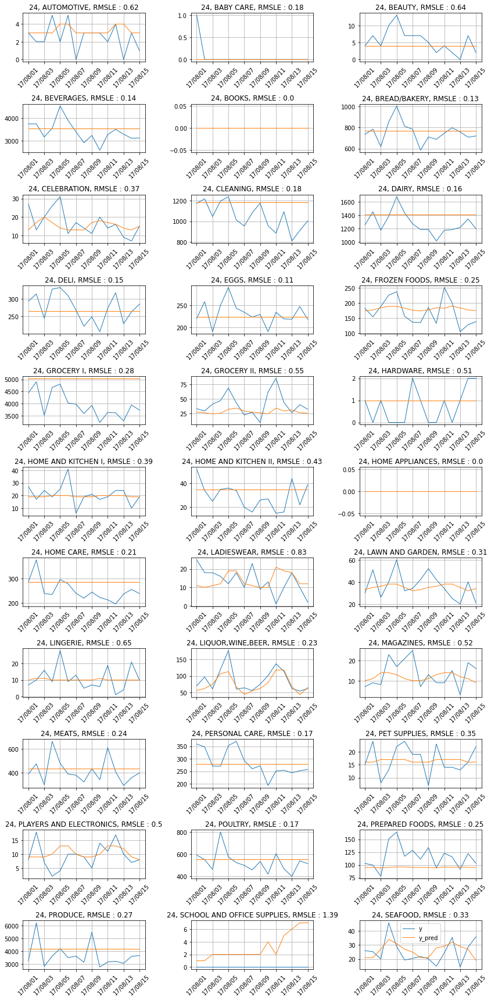

******************************


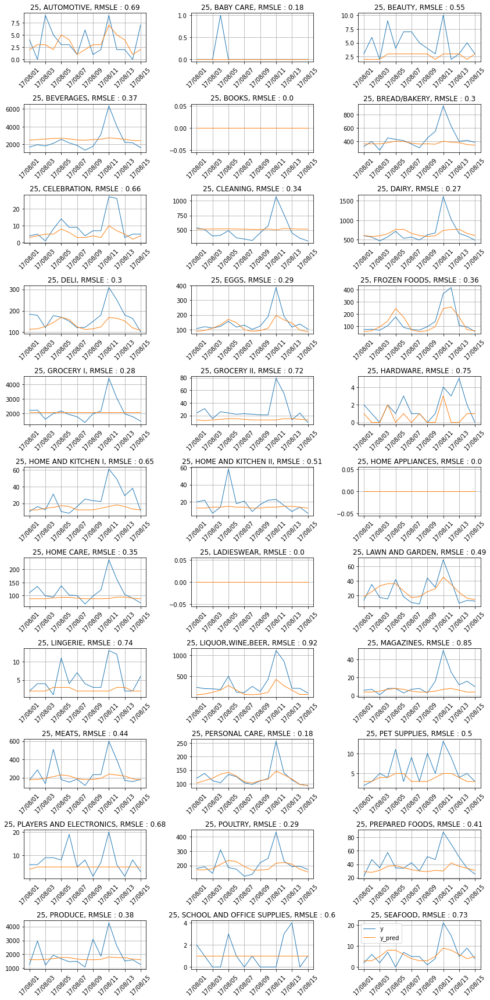

******************************


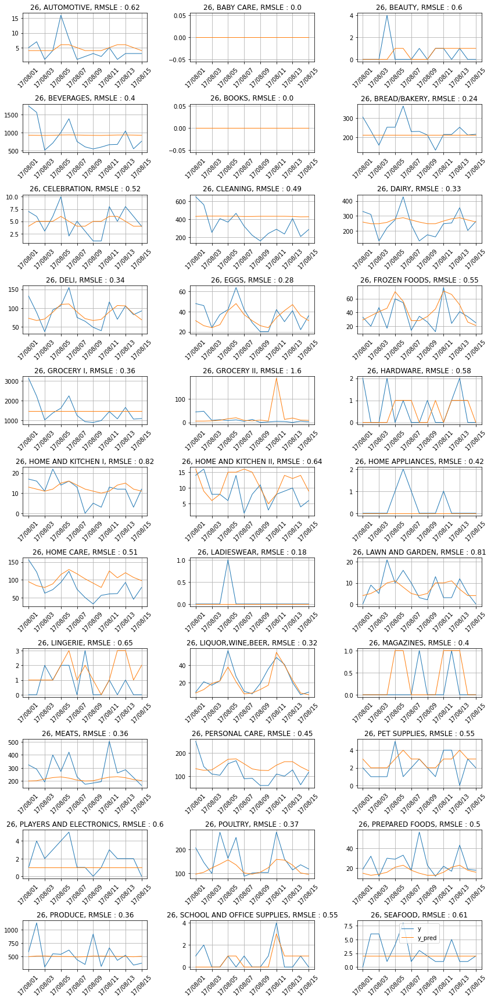

******************************


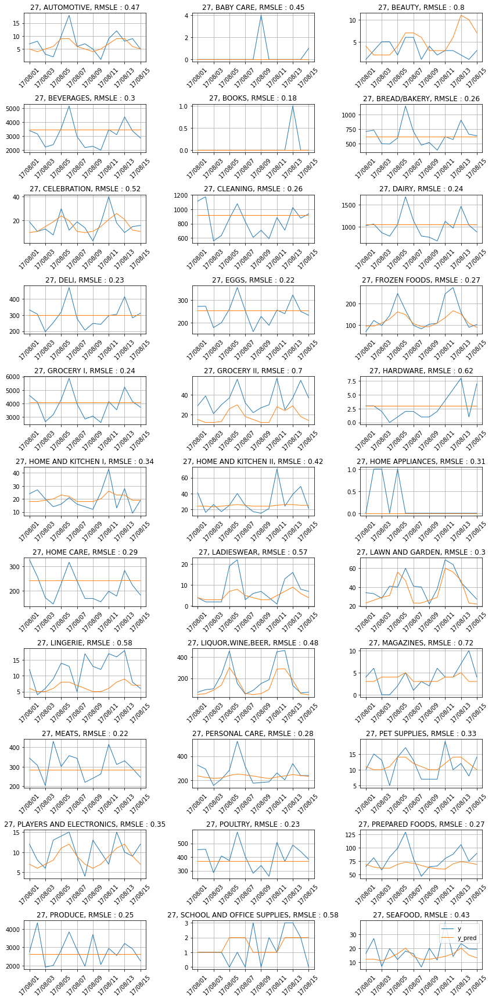

******************************


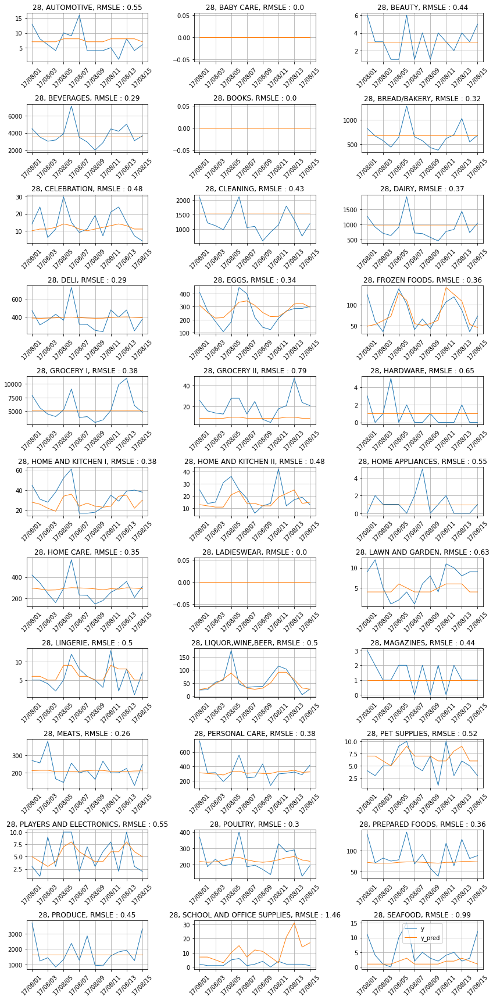

******************************


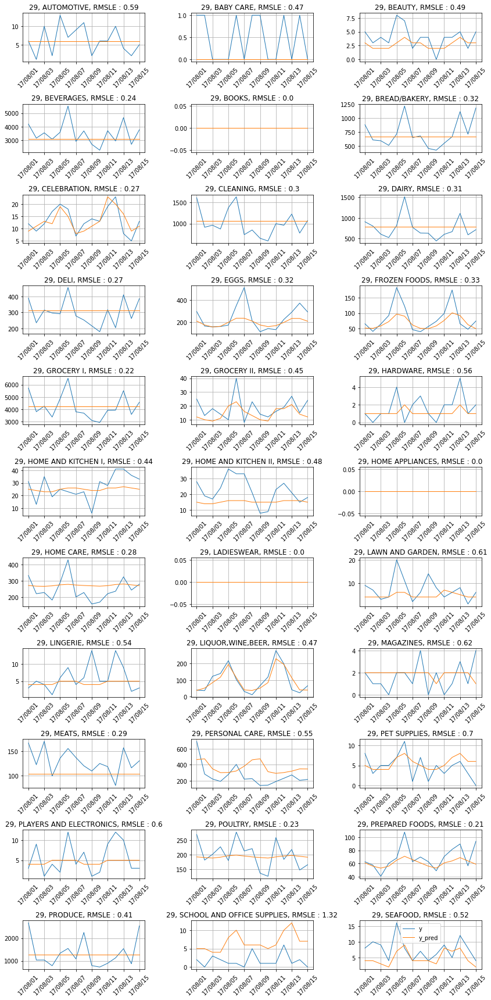

******************************


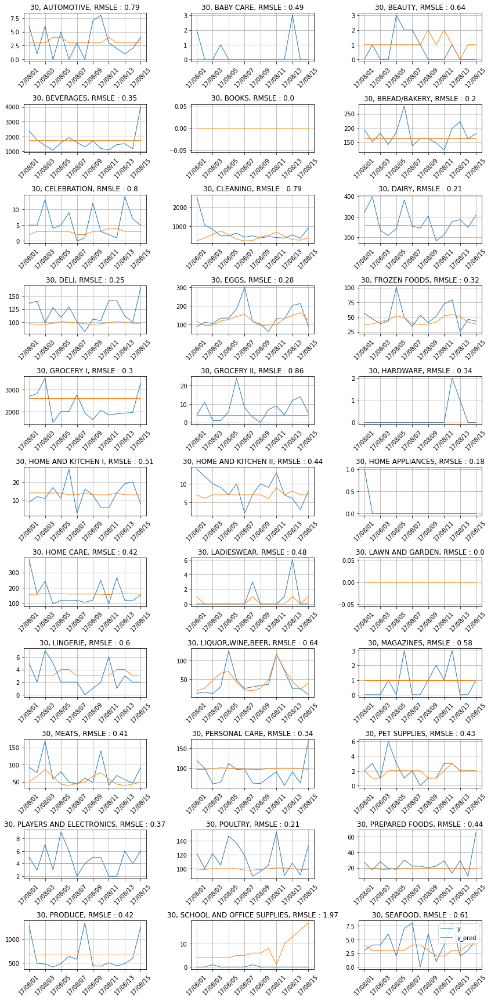

******************************


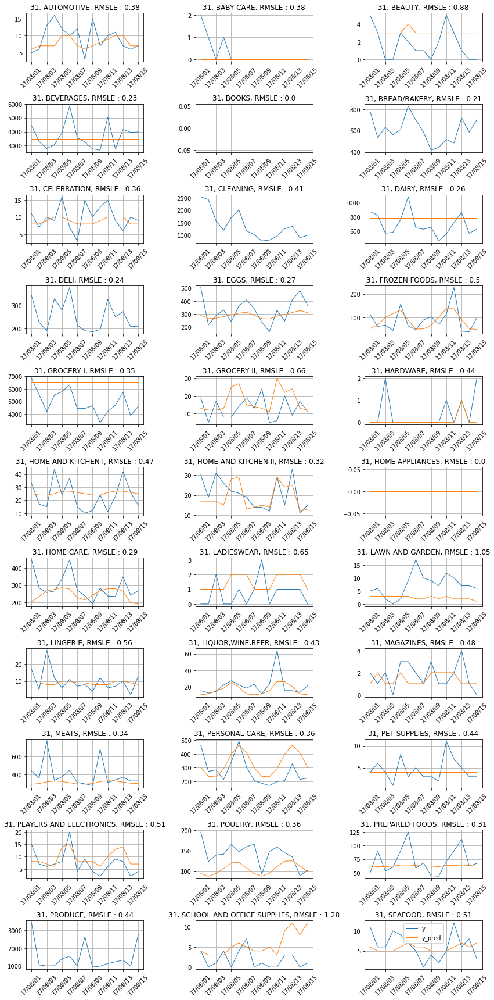

******************************


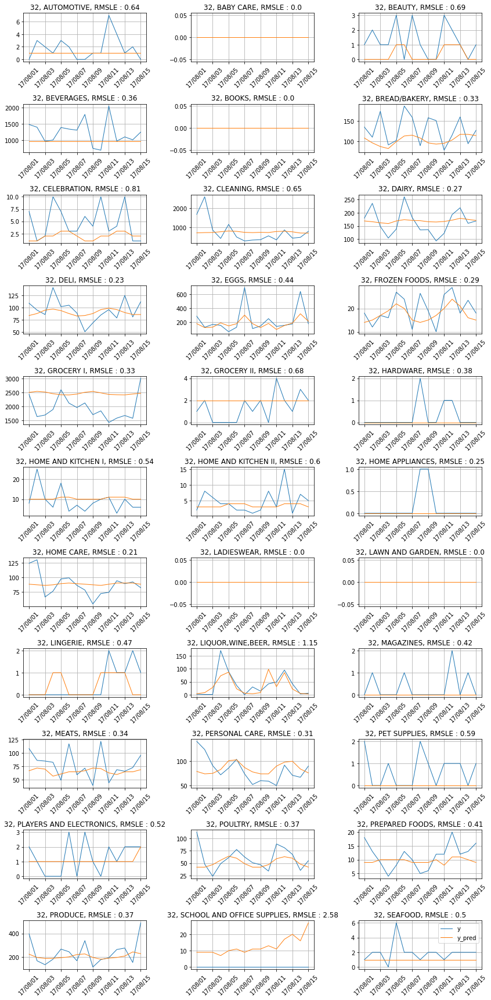

******************************


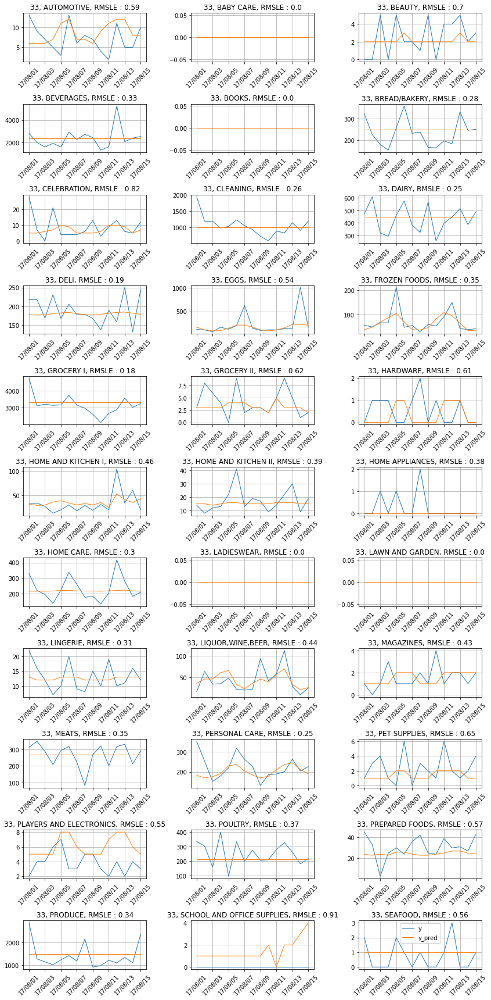

******************************


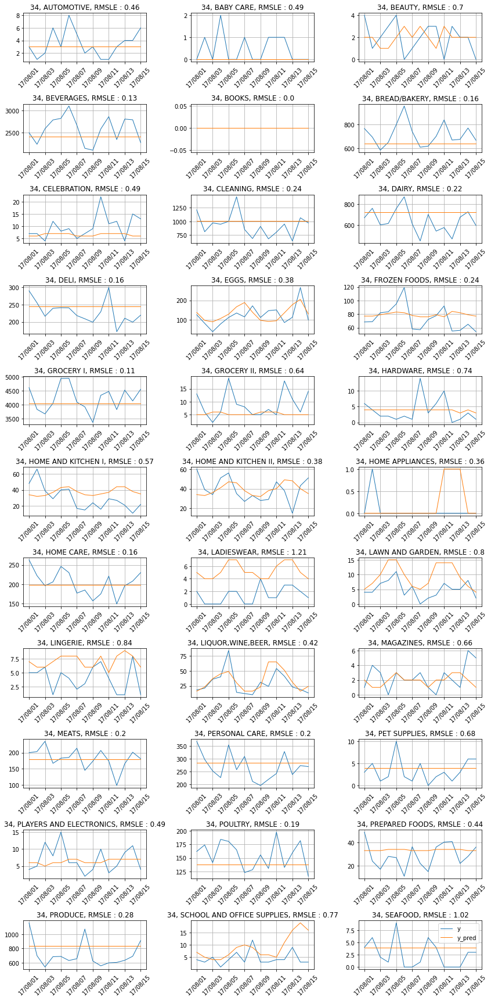

******************************


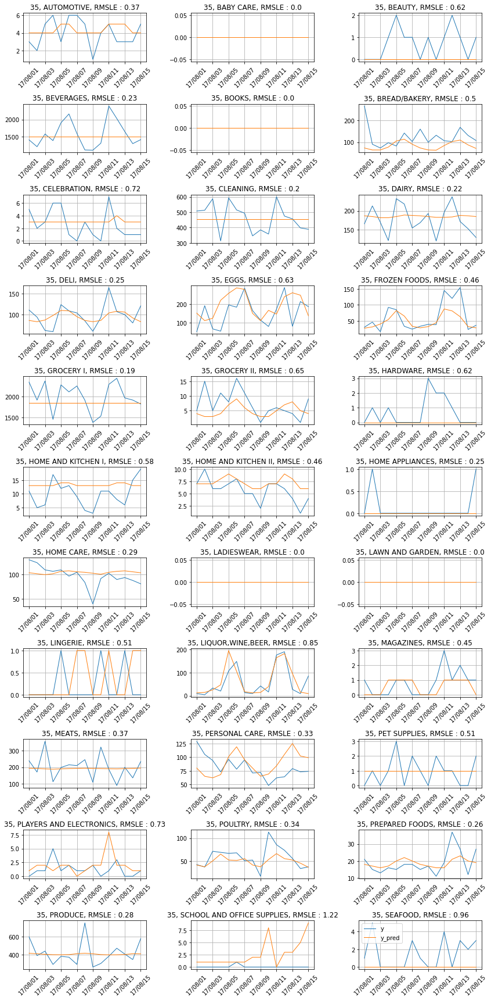

******************************


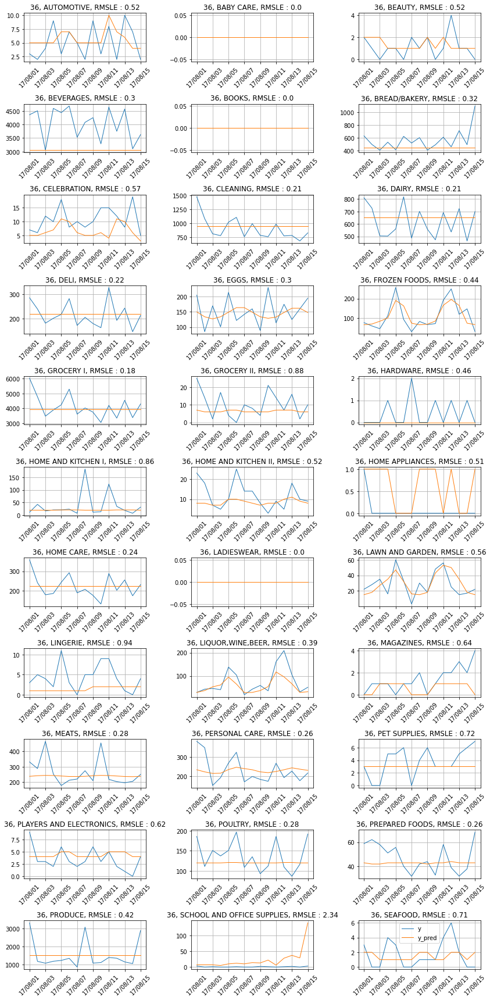

******************************


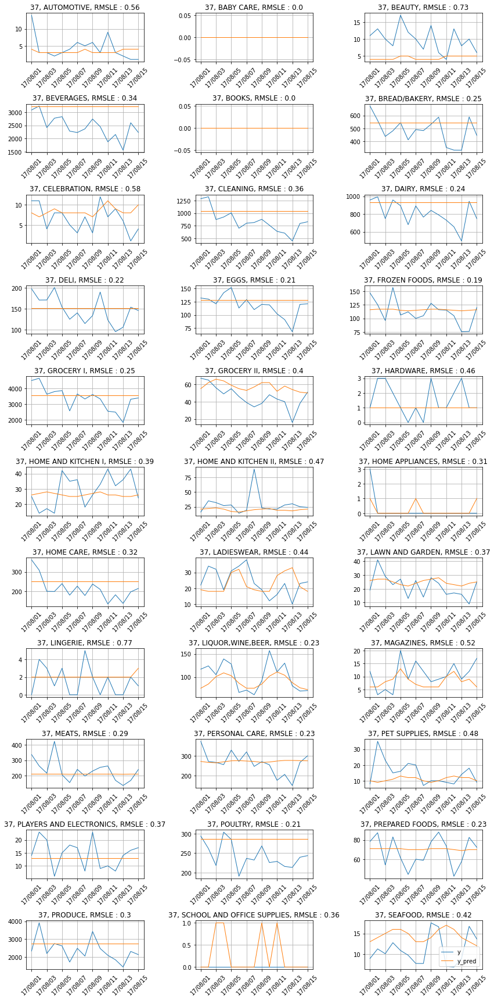

******************************


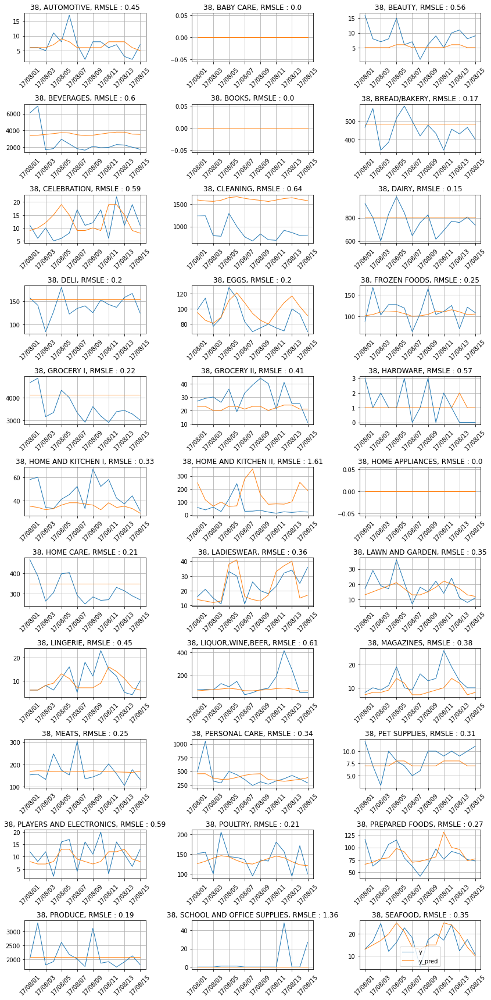

******************************


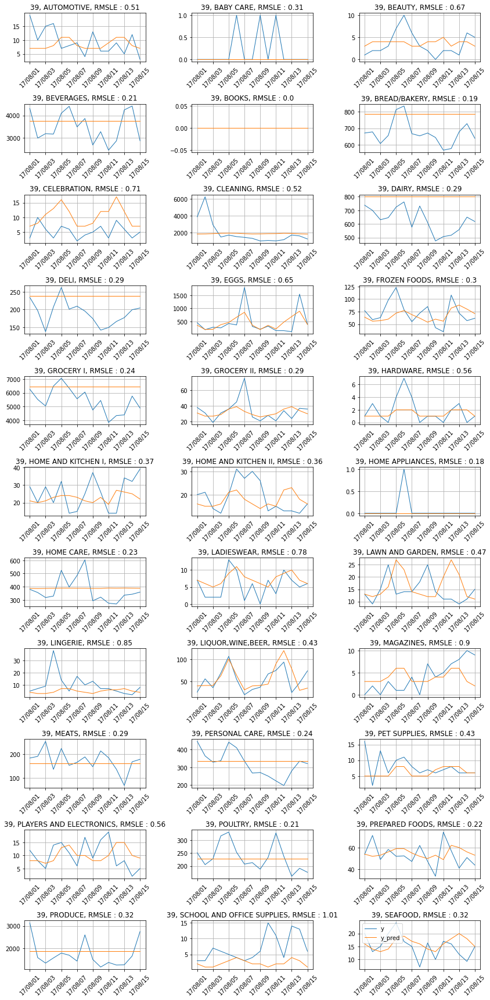

******************************


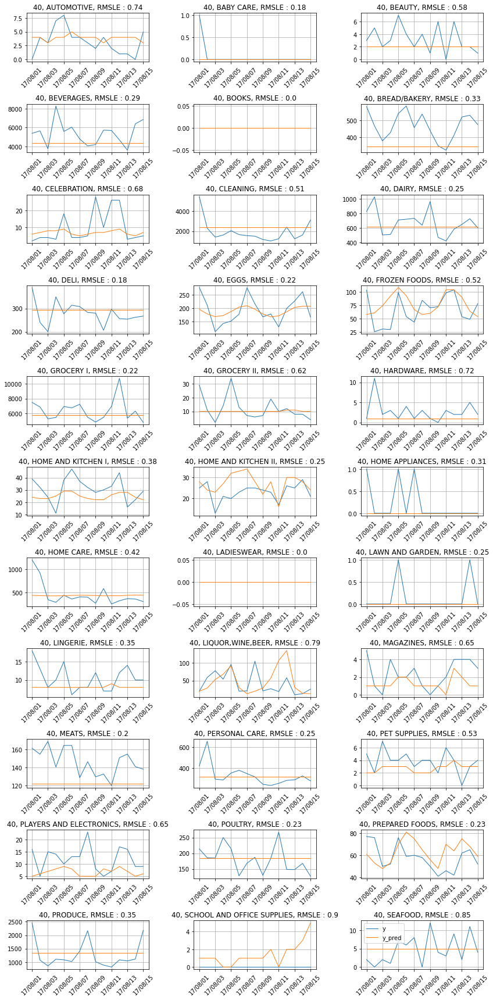

******************************


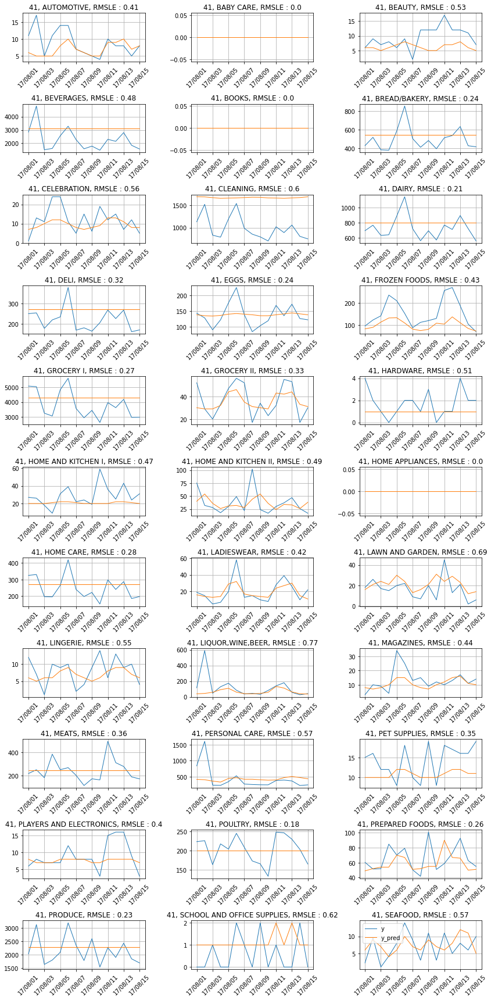

******************************


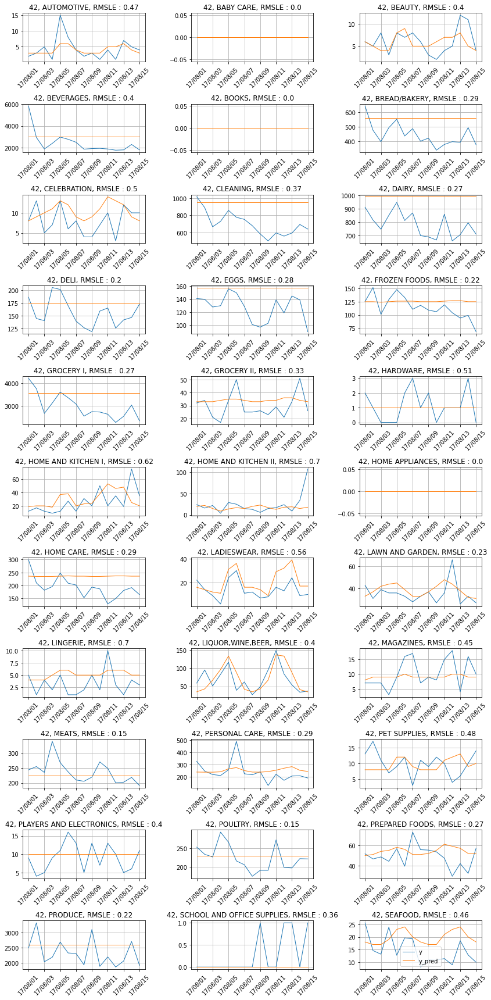

******************************


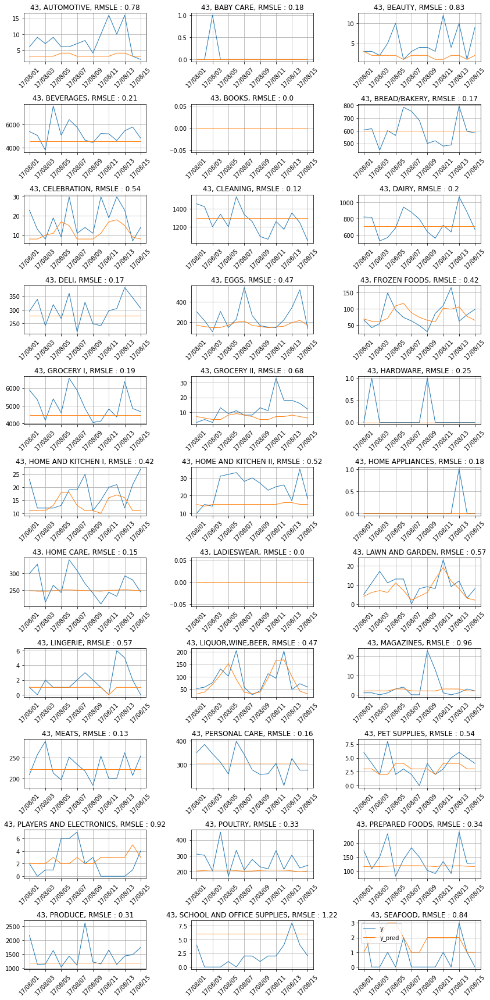

******************************


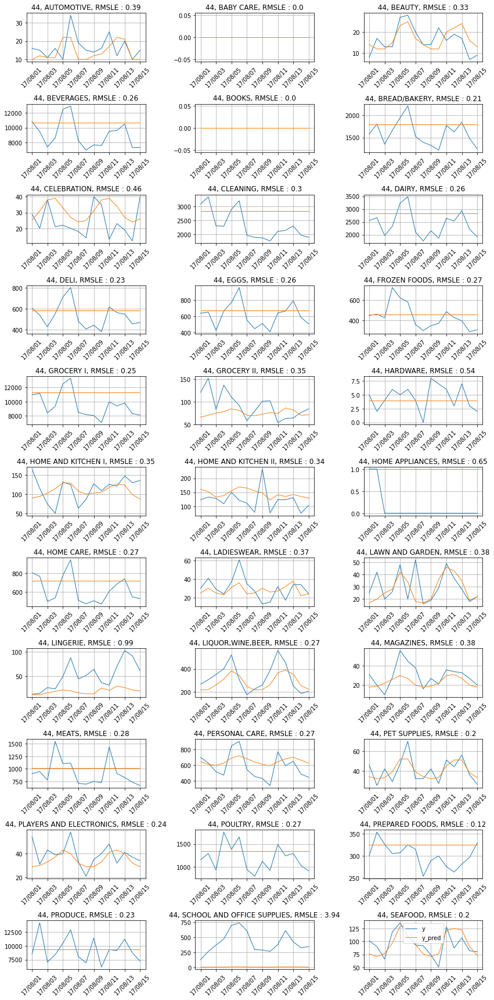

******************************


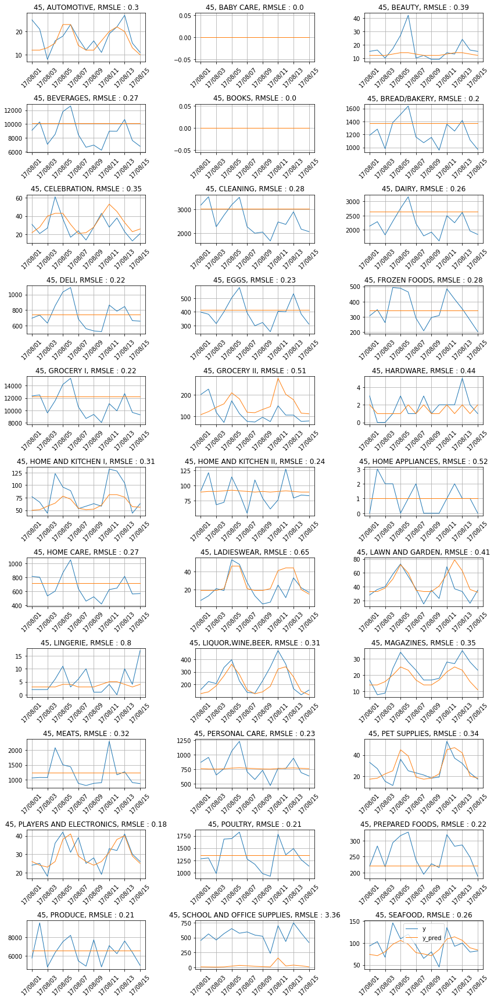

******************************


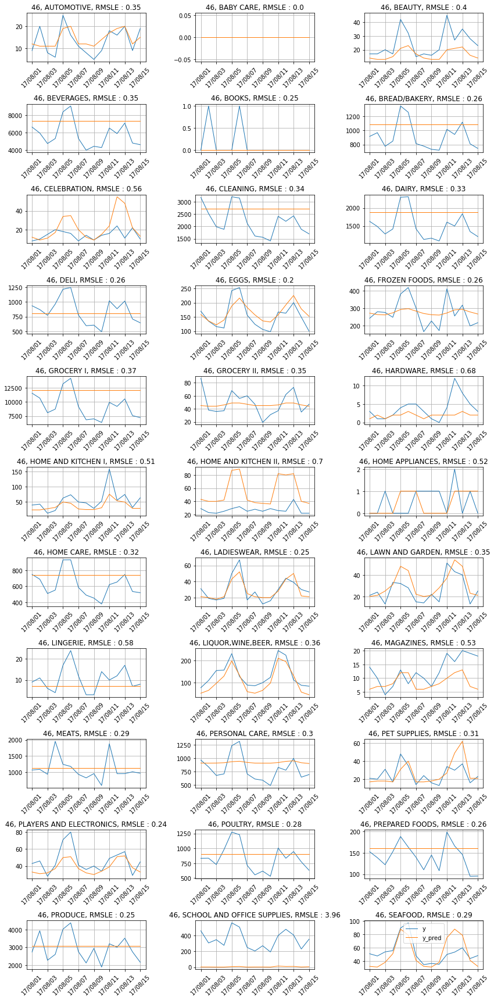

******************************


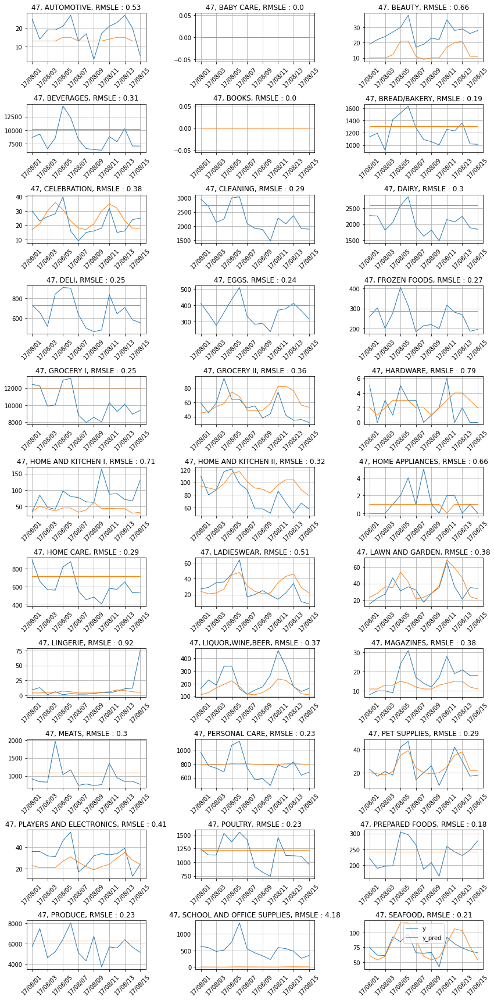

******************************


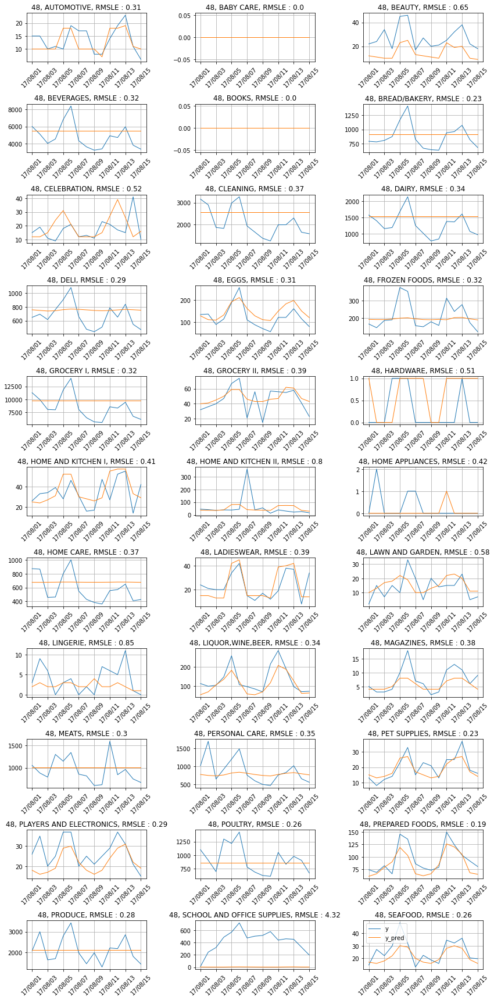

******************************


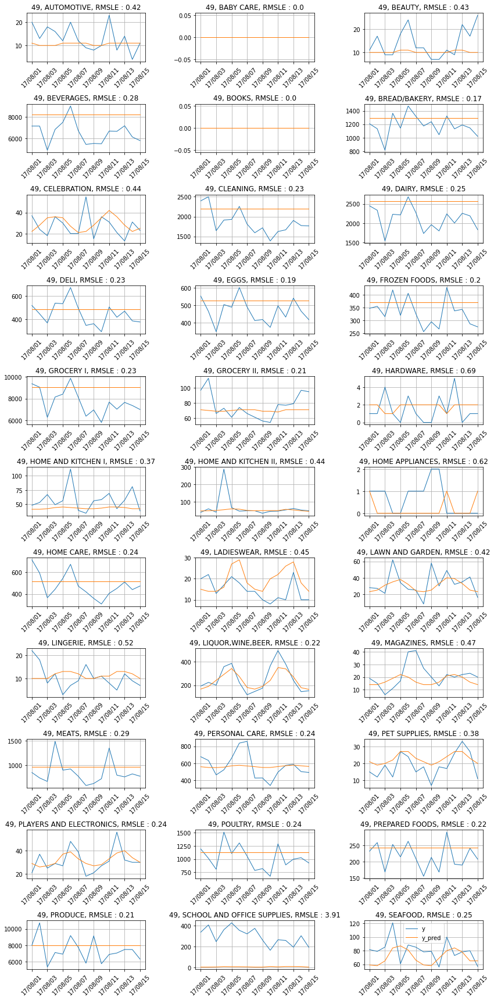

******************************


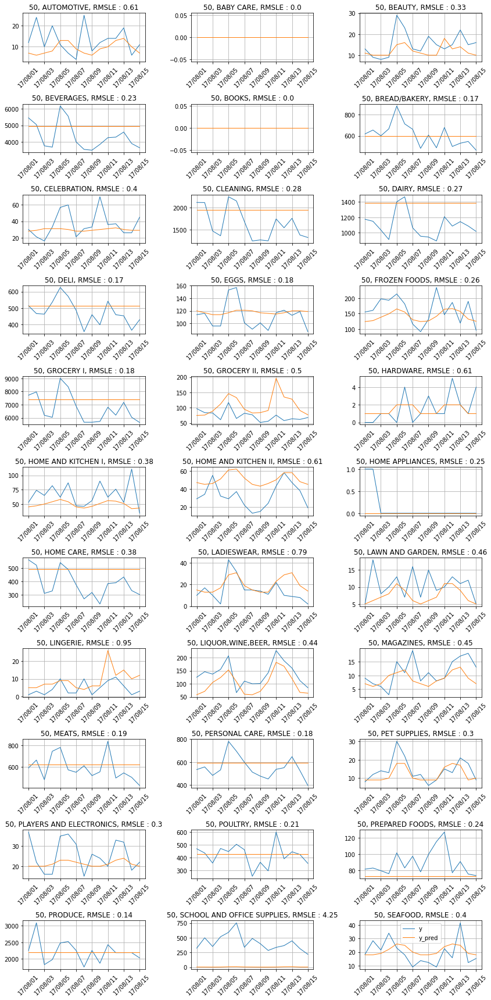

******************************


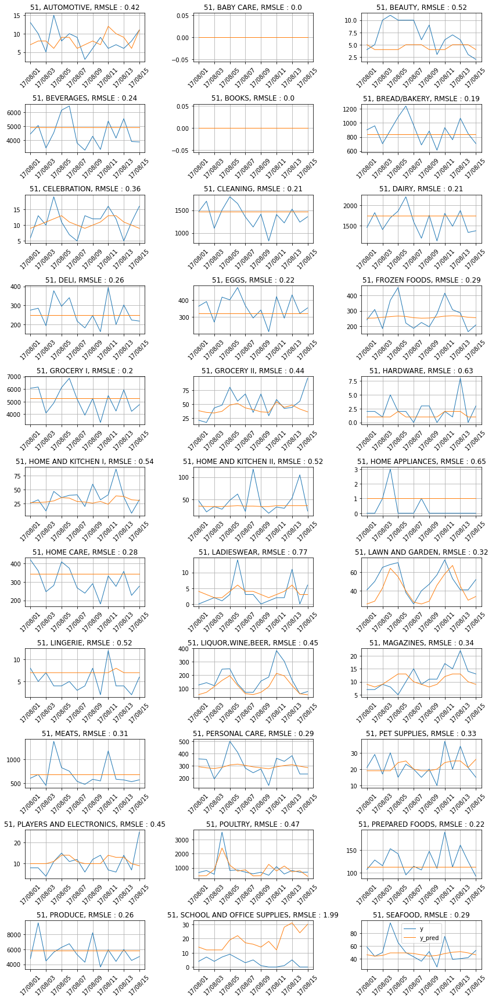

******************************


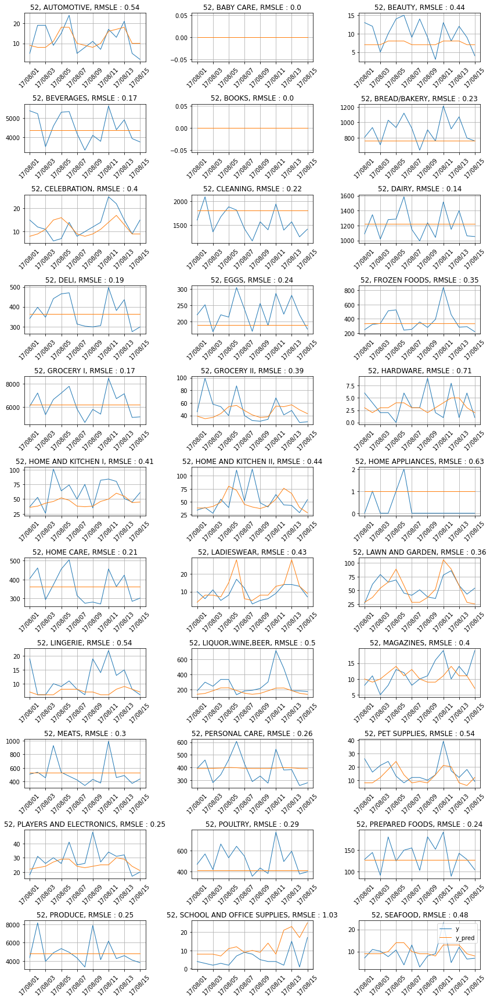

******************************


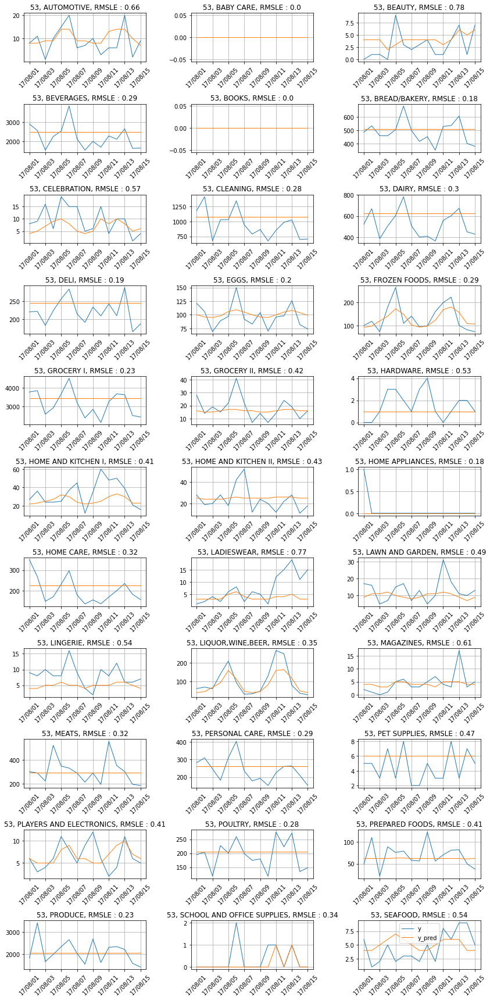

******************************


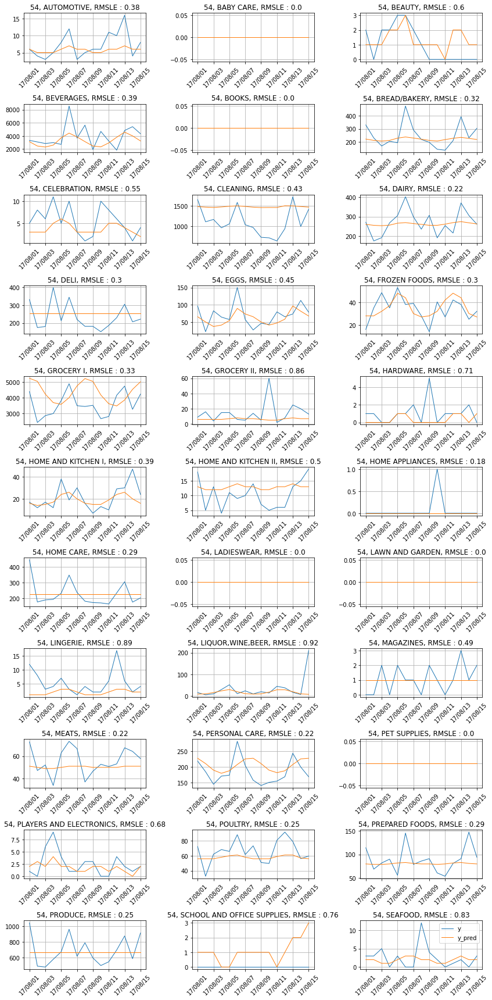

******************************


In [12]:
familys = df_result["family"].unique().tolist()
store_nbrs = df_result["store_nbr"].unique().tolist()
a = list(itertools.product(store_nbrs, familys))
params = df_result["params"].tolist()

cutoffs = conf["test_periods"]

#test = []
pre_nbr = 0
i = 1
test_rmsle = 0
test_result = []

for (nbr, family), param in zip(a, params):
  pattern = family2pattern[family]
  drop_columns = pattern2drop_columns[pattern]
  if family in cutoffs:
    cutoff = cutoffs[family]
  else:
    cutoff = cutoffs["other"]
  train_start = cutoff["train_start"]
  train_end = cutoff["train_end"]
  test_start = cutoff["test_start"]
  test_end = cutoff["test_end"]
  
  X = df_add_f.loc[train_start : train_end]
  y = df_train.loc[train_start : train_end].query(" (family==@family) & (store_nbr==@nbr) ").sales
  model = SVR_log(**param, drop_features=drop_columns)
  model.fit(X, y)
  y_true = df_train.loc[test_start : test_end].query(" (family==@family) & (store_nbr==@nbr) ").sales
  X_test = df_add_f.loc[test_start : test_end]
  y_pred = model.predict(X_test)
  y_pred[y_pred<0] = 0
  rmsle = mean_squared_log_error(y_true, y_pred, squared=False)
  test_rmsle += rmsle
  test_result.append([rmsle, family, nbr])

  x = y_true.index
  if pre_nbr != nbr:
    fig = plt.figure(figsize=(12, 24))
    i = 1
  #ax = fig.add_subplot(111)
  ax = fig.add_subplot(11, 3, i)
  ax.plot(x, y_true, linewidth=1.0, label="y")
  ax.plot(x, y_pred, linewidth=1.0, label="y_pred")
  ax.xaxis.set_major_formatter(DateFormatter("%y/%m/%d"))
  ax.set_title(f"{nbr}, {family}, RMSLE : {np.round(rmsle, 2)}")
  plt.xticks(rotation=45)
  plt.grid()
  i += 1
  if i == 34:
    fig.tight_layout()
    plt.legend()
    plt.show()
    print("***" * 10)
  pre_nbr = nbr

test_rmsle = test_rmsle / len(a)
plt.close()

In [13]:
df_result_test = pd.DataFrame(test_result)
df_result_test.columns = ["test_RMSLE", "family", "store_nbr"]
df_result = pd.merge(df_result, df_result_test, on=["family", "store_nbr"]).reindex(columns=["store_nbr", "family", "params", "val_RMSLE", "test_RMSLE"])
df_result.head()

,store_nbr,family,params,val_RMSLE,test_RMSLE
0,1,AUTOMOTIVE,"{'C': 0.1, 'gamma': 10, 'kernel': 'linear', 'r...",0.624249,0.531264
1,1,BABY CARE,"{'C': 0.01, 'gamma': 0.01, 'kernel': 'rbf', 'r...",0.000000,0.000000
2,1,BEAUTY,"{'C': 0.01, 'gamma': 0.01, 'kernel': 'rbf', 'r...",0.456527,0.483345
3,1,BEVERAGES,"{'C': 0.01, 'gamma': 0.01, 'kernel': 'rbf', 'r...",0.399550,0.408760
4,1,BOOKS,"{'C': 0.01, 'gamma': 0.01, 'kernel': 'rbf', 'r...",0.448476,0.000000


In [14]:
print(df_result["test_RMSLE"].mean())
df_result.groupby(["family"]).mean().sort_values("test_RMSLE", ascending=False)

0.4156550877155482


,store_nbr,val_RMSLE,test_RMSLE
family,,,
SCHOOL AND OFFICE SUPPLIES,27.5,0.471871,1.564266
LINGERIE,27.5,0.632980,0.663650
BEAUTY,27.5,0.533257,0.572717
HARDWARE,27.5,0.549262,0.569466
GROCERY II,27.5,0.570362,0.555277
CELEBRATION,27.5,0.546403,0.545494
MAGAZINES,27.5,0.514735,0.538697
AUTOMOTIVE,27.5,0.515247,0.520332
SEAFOOD,27.5,0.519150,0.501392


In [ ]:
a = df_result.groupby(["family"]).mean().sort_values("test_RMSLE", ascending=False)
a["test_RMSLE"].iloc[1:].mean()

0.3756785215139369

### 一番良かったparamで提出用のデータを予測

In [ ]:
# 提出用のcsvを作るために、idと(date, store_nbr, family)を紐づける辞書を作る
dates = df_test.index.tolist()
familys = df_test["family"].tolist()
store_nbrs = df_test["store_nbr"].tolist()
ids = df_test["id"].tolist()
id_dic = dict()

for date, nbr, family, id in zip(dates, store_nbrs, familys, ids):
  if (date, nbr, family) not in id_dic:
    id_dic[(date, nbr, family)] = id

In [ ]:
familys = df_result["family"].unique().tolist()
store_nbrs = df_result["store_nbr"].unique().tolist()
a = list(itertools.product(store_nbrs, familys))
params = df_result["params"].tolist()

cutoffs = conf["sub_periods"]
df_sub = pd.DataFrame()

for (nbr, family), param in zip(a, params):
  pattern = family2pattern[family]
  drop_columns = pattern2drop_columns[pattern]
  f = df_add_f.drop(drop_columns, axis=1)
  if family in cutoffs:
    cutoff = cutoffs[family]
  else:
    cutoff = cutoffs["other"]
  subtrain_start = cutoff["train_start"]
  subtrain_end = cutoff["train_end"]
  sub_start = cutoff["sub_start"]
  sub_end = cutoff["sub_end"]

  X = f.loc[subtrain_start : subtrain_end]
  y = df_train.loc[subtrain_start : subtrain_end].query(" (family==@family) & (store_nbr==@nbr) ").sales
  model = Ridge_log(**param)
  model.fit(X, y)
  X_sub = f.loc[sub_start : sub_end]
  y_sub = model.predict(X_sub)
  # date, nbr, familyでsubmission用のidを取り出す
  ids = [id_dic[(date, nbr, family)] for date in X_sub.index.tolist()]
  _sub = pd.DataFrame({"id" : ids, "sales" : y_sub})
  df_sub= pd.concat([df_sub, _sub])
df_sub = df_sub.sort_values(["id"])

In [ ]:
df_sub.head()

,id,sales
0,3000888,3.0
0,3000889,0.0
0,3000890,4.0
0,3000891,2248.0
0,3000892,0.0


In [ ]:
model_name = Ridge_log(**param).model_name
filename = datetime.now().strftime(format="%y%m%d%H%M") + '_' + model_name

df_result.to_csv(f"result/{filename}.csv", index=None)
df_sub.to_csv(f"submission/{filename}.csv", index=None)

In [ ]:
a = pd.read_csv("result/2209141538_Ridge_log.csv")
a.head()

,store_nbr,family,params,val_RMSLE,test_RMSLE
0,1,AUTOMOTIVE,{'alpha': 10},0.622882,0.509385
1,1,BABY CARE,{'alpha': 0.01},0.000000,0.000000
2,1,BEAUTY,{'alpha': 10},0.482125,0.558789
3,1,BEVERAGES,{'alpha': 0.1},0.248547,0.224953
4,1,BOOKS,{'alpha': 0.01},0.448476,0.178970


In [ ]:
print(df_result["val_RMSLE"].mean())
print(a["val_RMSLE"].mean())

0.37694389300510184
0.3834395483050951


In [ ]:
print(df_result["test_RMSLE"].mean())
print(a["test_RMSLE"].mean())

0.4142115957067372
0.4117756299226368
